In [78]:
# prompt: mounting drive code

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.subplots as sp
from pandas.api.types import CategoricalDtype

In [80]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Calorie Project/train.csv')

In [81]:
df.head()

,id,Sex,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,0,male,36,189.0,82.0,26.0,101.0,41.0,150.0
1,1,female,64,163.0,60.0,8.0,85.0,39.7,34.0
2,2,female,51,161.0,64.0,7.0,84.0,39.8,29.0
3,3,male,20,192.0,90.0,25.0,105.0,40.7,140.0
4,4,female,38,166.0,61.0,25.0,102.0,40.6,146.0


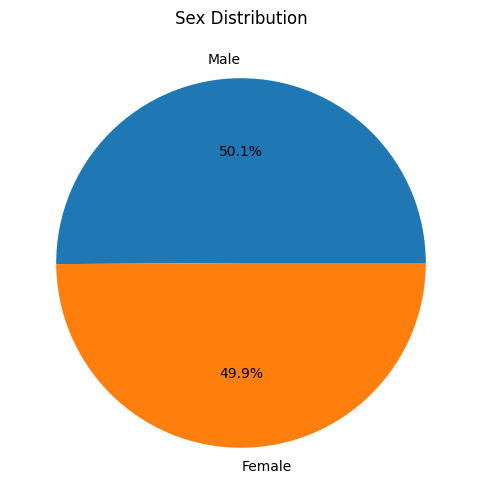

In [82]:
# Create a pie chart for Sex
plt.figure(figsize=(10, 6))
plt.pie(df['Sex'].value_counts(), labels=['Male', 'Female'], autopct='%1.1f%%')
plt.title('Sex Distribution')
plt.show()

In [83]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


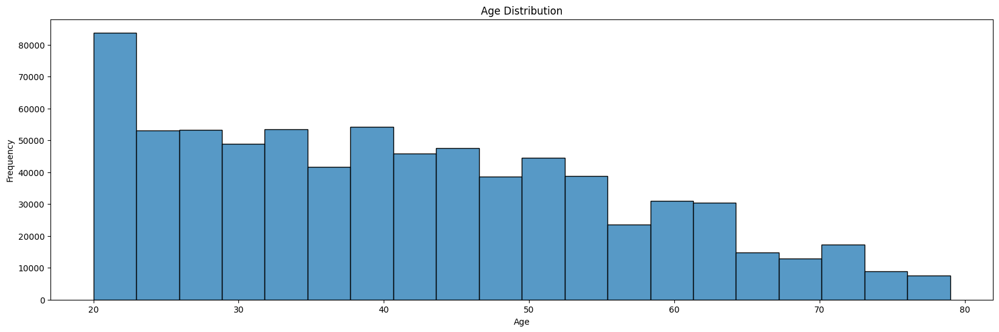

In [84]:
# show me age distribution
plt.figure(figsize=(20, 6))
sns.histplot(df['Age'], bins=20)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()


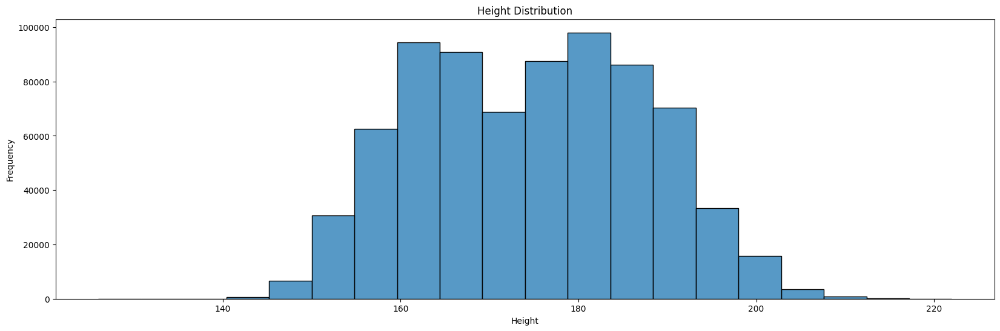

In [85]:
# show me height distribution
plt.figure(figsize=(20, 6))
sns.histplot(df['Height'], bins=20)
plt.title('Height Distribution')
plt.xlabel('Height')
plt.ylabel('Frequency')
plt.show()

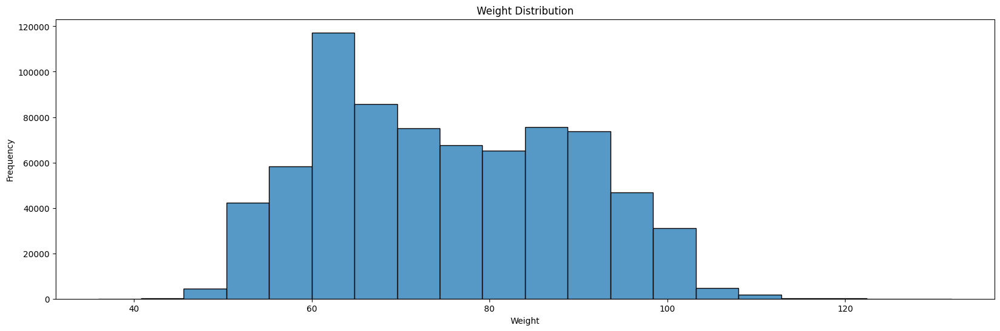

In [86]:
# show me weight distribution
plt.figure(figsize=(20, 6))
sns.histplot(df['Weight'], bins=20)
plt.title('Weight Distribution')
plt.xlabel('Weight')
plt.ylabel('Frequency')
plt.show()

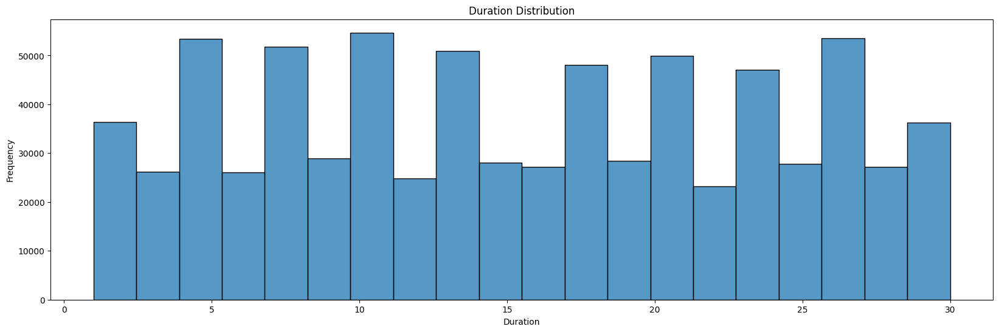

In [87]:
# show me Duration distribution
plt.figure(figsize=(20, 6))
sns.histplot(df['Duration'], bins=20)
plt.title('Duration Distribution')
plt.xlabel('Duration')
plt.ylabel('Frequency')
plt.show()

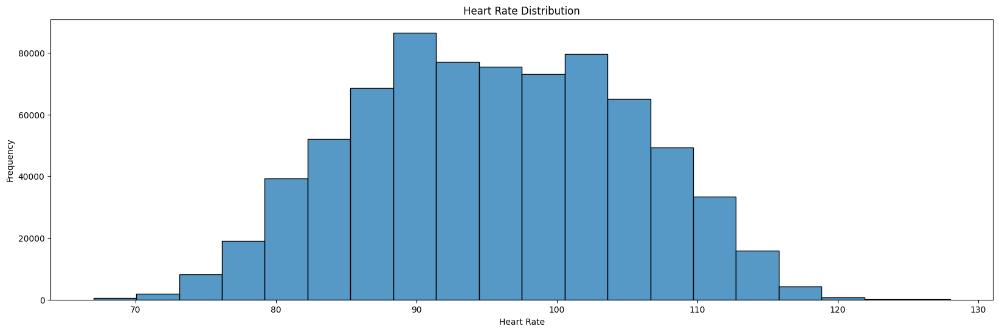

In [88]:
# show me heart rate distribution
plt.figure(figsize=(20, 6))
sns.histplot(df['Heart_Rate'], bins=20)
plt.title('Heart Rate Distribution')
plt.xlabel('Heart Rate')
plt.ylabel('Frequency')
plt.show()


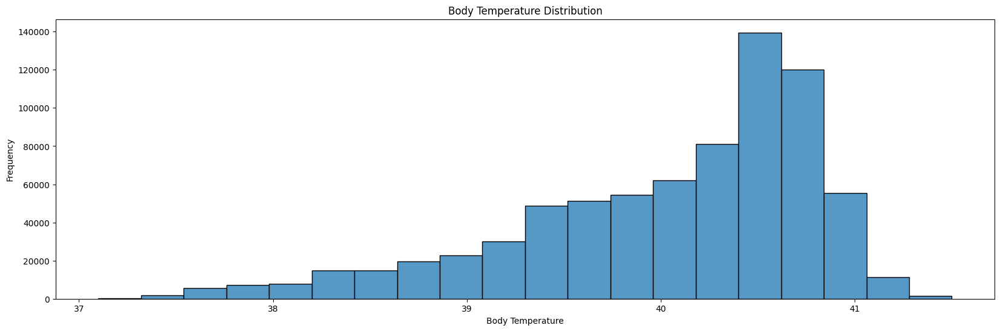

In [89]:
# show me body temperature distribution
plt.figure(figsize=(20, 6))
sns.histplot(df['Body_Temp'], bins=20)
plt.title('Body Temperature Distribution')
plt.xlabel('Body Temperature')
plt.ylabel('Frequency')
plt.show()

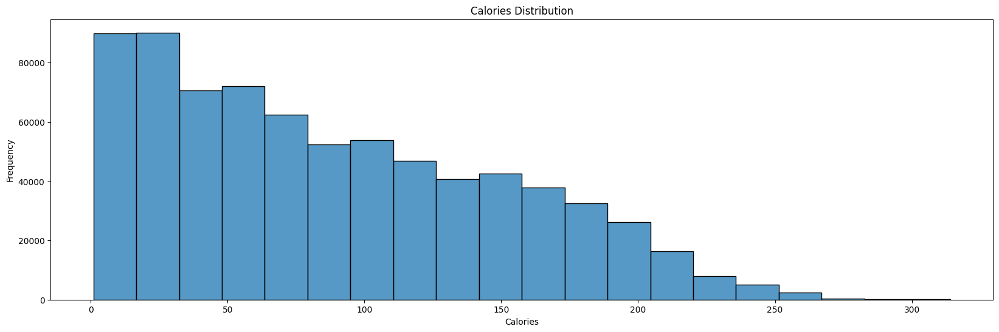

In [90]:
# show me calories distribution
plt.figure(figsize=(20, 6))
sns.histplot(df['Calories'], bins=20)
plt.title('Calories Distribution')
plt.xlabel('Calories')
plt.ylabel('Frequency')
plt.show()

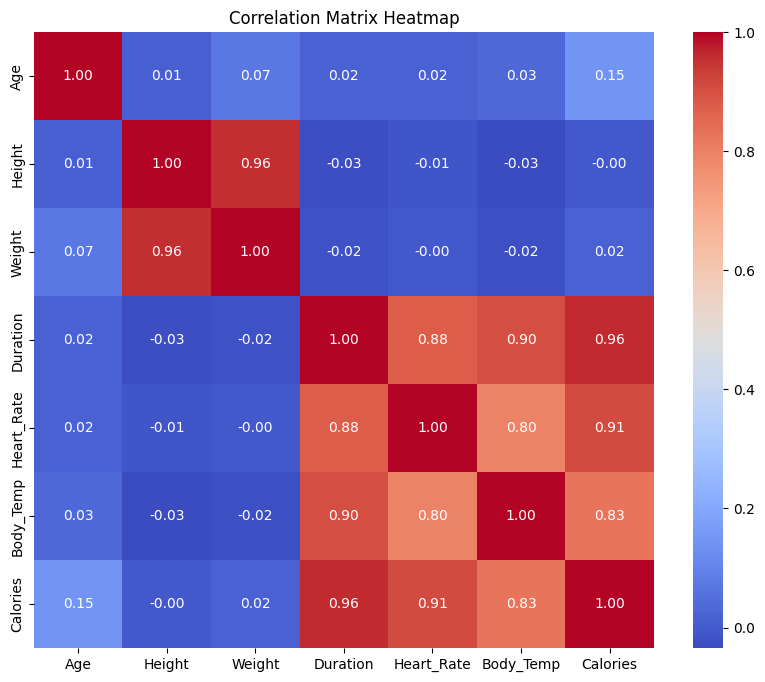

In [91]:
# Heatmap Correlation Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(df.drop(['id'], axis=1).select_dtypes(include=np.number).corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()

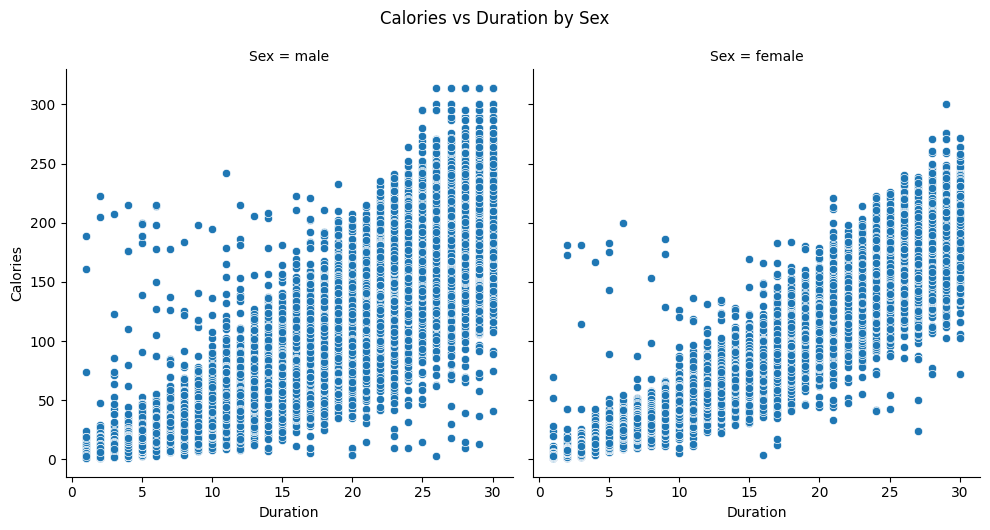

In [92]:
# Faceted Scatter Plots by Sex (Calories vs Duration)
g = sns.FacetGrid(df, col='Sex', height=5)
g.map_dataframe(sns.scatterplot, x='Duration', y='Calories')
g.fig.suptitle('Calories vs Duration by Sex', y=1.05)
plt.show()

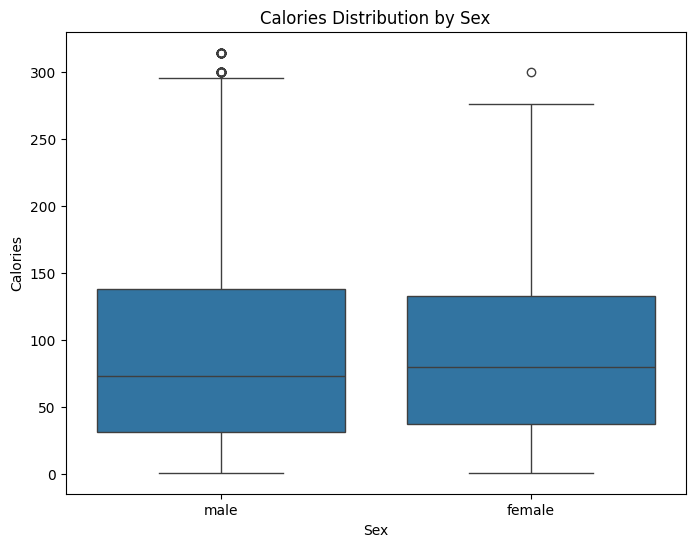

In [93]:
# Box Plots by Sex (Calories)
plt.figure(figsize=(8, 6))
sns.boxplot(x='Sex', y='Calories', data=df)
plt.title('Calories Distribution by Sex')
plt.show()

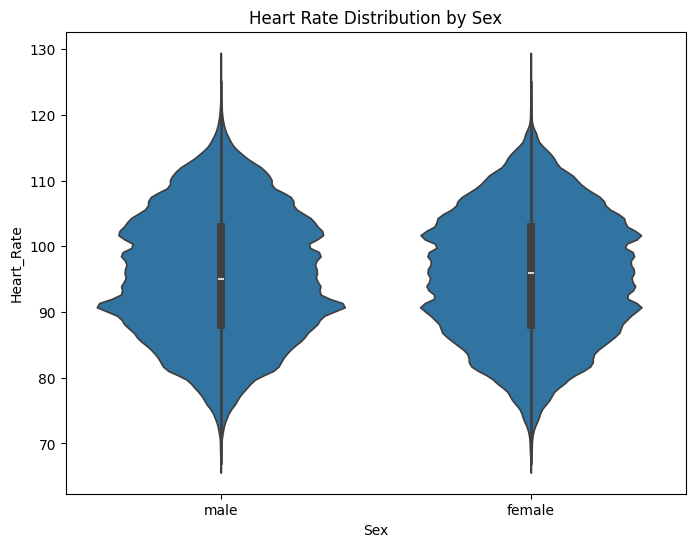

In [94]:
# Violin Plots by Sex (Heart Rate)
plt.figure(figsize=(8, 6))
sns.violinplot(x='Sex', y='Heart_Rate', data=df)
plt.title('Heart Rate Distribution by Sex')
plt.show()

In [95]:
# Bubble Chart (Age vs Weight, bubble size = Calories, color = Sex)
fig = px.scatter(df, x='Age', y='Weight', size='Calories', color='Sex',
                 title='Bubble Chart: Age vs Weight (Bubble = Calories)')
fig.show()

In [96]:
# Check for null values in each column
print(df.isnull().sum())


id            0
Sex           0
Age           0
Height        0
Weight        0
Duration      0
Heart_Rate    0
Body_Temp     0
Calories      0
dtype: int64


In [97]:
df.shape

(750000, 9)

In [98]:
from sklearn.preprocessing import MinMaxScaler

def preprocess_data(df):
  """
  Preprocesses the input DataFrame.

  Args:
    df: The input DataFrame.

  Returns:
    The preprocessed DataFrame.
  """

  # Remove 'id' column
  if 'id' in df.columns:
    df = df.drop('id', axis=1)

  # One-hot encode 'Sex' column
  df = pd.get_dummies(df, columns=['Sex'], drop_first=True, dtype=int)

  # Fill null values in numerical columns with the median
  numerical_cols = df.select_dtypes(include=np.number).columns
  for col in numerical_cols:
    if df[col].isnull().any():
      df[col] = df[col].fillna(df[col].median())

  # Scale numerical columns using MinMaxScaler
  #scaler = MinMaxScaler()
  #df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

  return df


In [99]:
data = preprocess_data(df)

In [100]:
data.head()

,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories,Sex_male
0,36,189.0,82.0,26.0,101.0,41.0,150.0,1
1,64,163.0,60.0,8.0,85.0,39.7,34.0,0
2,51,161.0,64.0,7.0,84.0,39.8,29.0,0
3,20,192.0,90.0,25.0,105.0,40.7,140.0,1
4,38,166.0,61.0,25.0,102.0,40.6,146.0,0


In [103]:
chunks = np.array_split(data, 5)

/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:57: FutureWarning:

'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.



In [108]:
# Extract all numeric feature columns
features = data.select_dtypes(include=[np.number]).columns

# Dictionary to store priors for each feature (from first chunk)
priors = {
    feature: {
        'mu': chunks[0][feature].mean(),
        'sigma2': chunks[0][feature].var()
    }
    for feature in features
}

# Initialize running statistics for variance estimation
running_stats = {
    feature: {
        'n': len(chunks[0]),
        'mean': chunks[0][feature].mean(),
        'M2': ((chunks[0][feature] - chunks[0][feature].mean())**2).sum()
    }
    for feature in features
}

# Store data seen so far for calculating true means
all_data_seen = chunks[0]

print("Bayesian Posterior vs True Sample Means (per feature)")
print("Using Empirical Prior from First Chunk and Running Variance")
print("=" * 50)

for i, chunk in enumerate(chunks[1:], start=2):  # Start from chunk 2
    all_data_seen = pd.concat([all_data_seen, chunk], ignore_index=True)

    print(f"\nAfter Chunk {i}:")

    for feature in features:
        x_bar = chunk[feature].mean()
        n = len(chunk)

        # Update running variance (Welford's algorithm)
        new_mean = running_stats[feature]['mean'] + (x_bar - running_stats[feature]['mean']) / (running_stats[feature]['n'] + n)
        running_stats[feature]['M2'] += ((chunk[feature] - running_stats[feature]['mean']) * (chunk[feature] - new_mean)).sum()
        running_stats[feature]['n'] += n
        running_stats[feature]['mean'] = new_mean
        sigma2_likelihood = running_stats[feature]['M2'] / (running_stats[feature]['n'] - 1) if running_stats[feature]['n'] > 1 else priors[feature]['sigma2']

        mu_prior = priors[feature]['mu']
        sigma2_prior = priors[feature]['sigma2']

        # Bayesian update
        var_post = 1 / (1/sigma2_prior + n/sigma2_likelihood)
        mu_post = var_post * (mu_prior/sigma2_prior + n*x_bar/sigma2_likelihood)

        true_mean = all_data_seen[feature].mean()

        print(f"  {feature:<12} - Posterior: {mu_post:.4f}, True: {true_mean:.4f}")

        # Update priors for next round
        priors[feature]['mu'] = mu_post
        priors[feature]['sigma2'] = var_post

    print("-" * 50)

Bayesian Posterior vs True Sample Means (per feature)
Using Empirical Prior from First Chunk and Running Variance

After Chunk 2:
  Age          - Posterior: 41.3801, True: 41.3774
  Height       - Posterior: 174.6882, True: 174.6899
  Weight       - Posterior: 75.1307, True: 75.1297
  Duration     - Posterior: 15.4276, True: 15.4198
  Heart_Rate   - Posterior: 95.5122, True: 95.4938
  Body_Temp    - Posterior: 40.0368, True: 40.0360
  Calories     - Posterior: 88.3718, True: 88.3169
  Sex_male     - Posterior: 0.4995, True: 0.4990
--------------------------------------------------

After Chunk 3:
  Age          - Posterior: 41.4082, True: 41.3971
  Height       - Posterior: 174.6966, True: 174.6949
  Weight       - Posterior: 75.1466, True: 75.1407
  Duration     - Posterior: 15.4066, True: 15.4085
  Heart_Rate   - Posterior: 95.4713, True: 95.4727
  Body_Temp    - Posterior: 40.0351, True: 40.0352
  Calories     - Posterior: 88.1861, True: 88.2115
  Sex_male     - Posterior: 0.4996, 

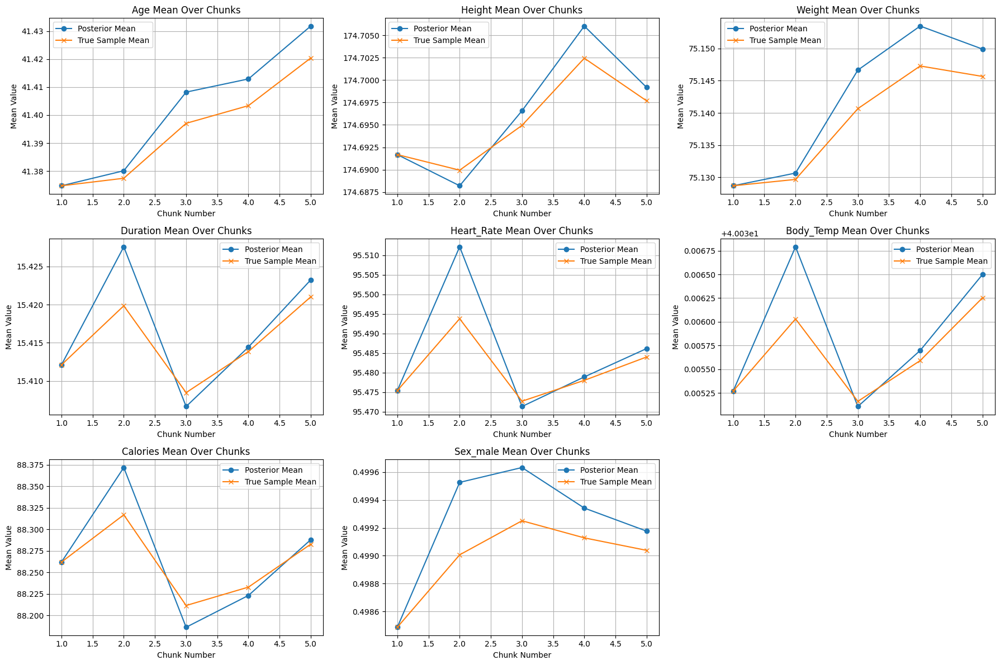

In [109]:

# Split data into chunks
chunks = np.array_split(data, 5)
features = data.select_dtypes(include=np.number).columns

# Set empirical priors from first chunk
priors = {
    feature: {
        'mu': chunks[0][feature].mean(),
        'sigma2': chunks[0][feature].var()
    }
    for feature in features
}

# Assume known variance per feature (empirical from full data)
data_variance = {feature: data[feature].var() for feature in features}

# Track means per chunk
posterior_means = {feature: [priors[feature]['mu']] for feature in features}
true_means = {feature: [chunks[0][feature].mean()] for feature in features}

# Start with first chunk as seen data
all_data_seen = chunks[0]

# Run Bayesian updates per chunk
for chunk in chunks[1:]:
    all_data_seen = pd.concat([all_data_seen, chunk], ignore_index=True)

    for feature in features:
        mu_prior = priors[feature]['mu']
        sigma2_prior = priors[feature]['sigma2']
        sigma2_likelihood = data_variance[feature]

        x_bar = chunk[feature].mean()
        n = len(chunk)

        # Bayesian update
        var_post = 1 / (1/sigma2_prior + n/sigma2_likelihood)
        mu_post = var_post * (mu_prior/sigma2_prior + n*x_bar/sigma2_likelihood)

        # Store updated values
        posterior_means[feature].append(mu_post)
        true_means[feature].append(all_data_seen[feature].mean())

        # Update prior
        priors[feature]['mu'] = mu_post
        priors[feature]['sigma2'] = var_post

# Visualization
num_features = len(features)
cols = 3
rows = (num_features + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(18, 4 * rows))
axes = axes.flatten()

for i, feature in enumerate(features):
    ax = axes[i]
    ax.plot(range(1, 6), posterior_means[feature], marker='o', label='Posterior Mean')
    ax.plot(range(1, 6), true_means[feature], marker='x', label='True Sample Mean')
    ax.set_title(f"{feature} Mean Over Chunks")
    ax.set_xlabel("Chunk Number")
    ax.set_ylabel("Mean Value")
    ax.legend()
    ax.grid(True)

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
